
# Working with large data - 1,3 million images


This project arised from need to efficiently process 1,3 million images, to be fed for Neural Network.
Images (90 GB) are larger than RAM, so they need to be read and processed in batches.

Extracted numerical features are also large, so instead of storing all in RAM, we output them into a structure that gets automatically written to disk in batches.


In this notebook
- reading data (images) in batches
- parallel reading/processing with multi threads
- building a Generator to feed batches
- extracting features from images, to be used in traditional ML model, by using pretrained Keras-models
- fine tuning pretrained Keras models with our data





Kaggles Avito demand prediction competition, for Russias bigggest classified advertisement site. https://www.kaggle.com/c/avito-demand-prediction

Task is to predict which classified adds get a sale and which not. There is a lot textual data, including advertisement text. In addition there are images related to the advertisements. We want to extract features in numerical form from the images, so we can use those extracted features in traditional ML model in addition to get more accurate prediction.




In [1]:
# credits for https://www.kaggle.com/classtag/extract-avito-image-features-via-keras-vgg16/notebook

In [3]:
import numpy as np 
import pandas as pd  
import time
import gc

### Read filenames for images from csv file

In [4]:
# get imagenames from csv
start = time.time()
imagenames = pd.read_csv("./datassd/train.csv", usecols=["image"])
print(time.time() - start)

# add ".jpg" to end of imagenames
imagenames['image'] = imagenames['image']+".jpg"
imagenames['image'][0]

4.401752471923828


'd10c7e016e03247a3bf2d13348fe959fe6f436c1caf64c7679f17c333c959b19.jpg'

In [4]:
# get imagenames from csv
start = time.time()
imagenames = pd.read_csv("./datassd/train.csv")
print(time.time() - start)

# add ".jpg" to end of imagenames
imagenames['image'] = imagenames['image']+".jpg"
imagenames['image'][0]

13.225743055343628


'd10c7e016e03247a3bf2d13348fe959fe6f436c1caf64c7679f17c333c959b19.jpg'

In [6]:
imagenames


,item_id,user_id,region,city,parent_category_name,category_name,param_1,param_2,param_3,title,description,price,item_seq_number,activation_date,user_type,image,image_top_1,deal_probability
0,b912c3c6a6ad,e00f8ff2eaf9,Свердловская область,Екатеринбург,Личные вещи,Товары для детей и игрушки,Постельные принадлежности,NaN,NaN,Кокоби(кокон для сна),"Кокон для сна малыша,пользовались меньше месяц...",400.0,2,2017-03-28,Private,d10c7e016e03247a3bf2d13348fe959fe6f436c1caf64c...,1008.0,0.12789
1,2dac0150717d,39aeb48f0017,Самарская область,Самара,Для дома и дачи,Мебель и интерьер,Другое,NaN,NaN,Стойка для Одежды,"Стойка для одежды, под вешалки. С бутика.",3000.0,19,2017-03-26,Private,79c9392cc51a9c81c6eb91eceb8e552171db39d7142700...,692.0,0.00000
2,ba83aefab5dc,91e2f88dd6e3,Ростовская область,Ростов-на-Дону,Бытовая электроника,Аудио и видео,"Видео, DVD и Blu-ray плееры",NaN,NaN,Philips bluray,"В хорошем состоянии, домашний кинотеатр с blu ...",4000.0,9,2017-03-20,Private,b7f250ee3f39e1fedd77c141f273703f4a9be59db4b48a...,3032.0,0.43177
3,02996f1dd2ea,bf5cccea572d,Татарстан,Набережные Челны,Личные вещи,Товары для детей и игрушки,Автомобильные кресла,NaN,NaN,Автокресло,Продам кресло от0-25кг,2200.0,286,2017-03-25,Company,e6ef97e0725637ea84e3d203e82dadb43ed3cc0a1c8413...,796.0,0.80323
4,7c90be56d2ab,ef50846afc0b,Волгоградская область,Волгоград,Транспорт,Автомобили,С пробегом,ВАЗ (LADA),2110,"ВАЗ 2110, 2003",Все вопросы по телефону.,40000.0,3,2017-03-16,Private,54a687a3a0fc1d68aed99bdaaf551c5c70b761b16fd0a2...,2264.0,0.20797
5,51e0962387f7,bbfad0b1ad0a,Татарстан,Чистополь,Личные вещи,Товары для детей и игрушки,Автомобильные кресла,NaN,NaN,Авто люлька,В хорошем состоянии,1300.0,9,2017-03-28,Private,eb6ad1231c59d3dc7e4020e724ffe8e4d302023ddcbb99...,796.0,0.80323
6,c4f260a2b48a,08f469d2e6f7,Нижегородская область,Нижний Новгород,Для дома и дачи,Ремонт и строительство,Сантехника и сауна,NaN,NaN,Водонагреватель 100 литров нержавейка плоский,Электро водонагреватель накопительный на 100 л...,11000.0,125,2017-03-23,Private,0330f6ac561f5db1fa8226dd5e7e127b5671d44d075a98...,2823.0,0.00000
7,6b71309d6a8a,fef86baa002c,Пермский край,Пермь,Личные вещи,"Одежда, обувь, аксессуары",Женская одежда,Джинсы,26,Бойфренды colins,Бойфренды в хорошем состоянии.,500.0,61,2017-03-25,Private,9bab29a519e81c14f4582024adfebd4f11a4ac71d323a6...,567.0,0.80323
8,c5b969cb63a2,055825270190,Оренбургская область,Оренбург,Личные вещи,"Одежда, обувь, аксессуары",Женская одежда,Платья и юбки,> 50 (XXL),Платье,54 раз мер очень удобное,500.0,85,2017-03-17,Private,75ce06d1f939a31dfb2af8ac55f08fa998fa336d13ee05...,415.0,0.00000
9,b1570962e68c,f9e8f831d94c,Нижегородская область,Нижний Новгород,Личные вещи,Детская одежда и обувь,Для девочек,Обувь,25,Полу ботиночки замш натур.Бамбини,По стельке 15.5см мерить приокский район. Цвет...,400.0,136,2017-03-22,Company,54fb8521135fda77a860bfd2fac6bf46867ab7c06796e3...,46.0,0.00000


### Can we make file-reading faster?
### Read filenames in directory order using 'ls -U'

Above filelisting can be more or less in random order. Reading a million+ small files in mixed order is slow. 
Disk operations are faster when reading longer continuous areas.

The unix commandline command 'ls' has a parameter -U, which returns directory listing in the same order that the files are in the directory.




In [9]:
# Execute command 'ls -U' and store its output in a Pandas.Series

import subprocess
imagenames = pd.Series( 
             str.split( subprocess.getoutput("ls -U ./datassd/images/train")))
imagenames[0]
            # use pd.DataFrame if wish to store more fields

'69f3be8a49bd70bcce4041fa613dbef3f1162fb9753e2c2bb90642df42f964a8.jpg'

In [10]:
# DataFrames version

# Execute command 'ls -U' and store its output in a Pandas.Series (a single column of Pandas.DataFrame)

import subprocess
imagenames = pd.DataFrame( 
             str.split( subprocess.getoutput("ls -U ./datassd/images/train")))
imagenames['image'] = imagenames[0]
imagenames['image'][0]
            # use pd.DataFrame if wish to store more fields

# drop the column 0 as duplicate    
imagenames = imagenames.drop(0, 1)    

In [11]:
# check that it looks correct
imagenames

,image
0,69f3be8a49bd70bcce4041fa613dbef3f1162fb9753e2c...
1,c4834452c8c856db5ccd23ef147ac3da7676dede2ee25c...
2,86a1865e96b32e077dc7cef891bfe79bff4d2d420f64e7...
3,3015902c3fb37f576ee7a1d1a07d10f7b19eb2c92505dc...
4,c8cb3ea36bd00c1dc69700b648a7afbdeb0abebd8cd526...
5,7d2eecea1603de8eb5e38313ee0eb4409d0db8ecbcb551...
6,288a3fc1ccc1d1ce658532960830b96da2e01d322a5e51...
7,7a08d5d8f5d311e756c15b0a57651e6917502681d99ffd...
8,96d036620ad52dde25d2b4113217a8d0d7142c536dd3f6...
9,277e84fece697c9efcf4ddb69273ff93f1e5e97e744d4f...


# Reading and displaying images

We are going to use pretrained models from Keras, and many of them expect images of size 224x224, 
so we are gonna turn read images into 224x224 pixels. With 3 challes (red,green,blue) that will be 3x244x244 per image. 

In Python images read by different libraries/ways can have different structure.
Some use RGB colors while Keras uses BGR colors. Some forms assign values 0-255 for a color channel, others use -1 to 1.
Make sure you are aware of the structure your chosen methods stores images.


More about differences in images read in different way sin Python.
http://scikit-image.org/docs/stable/user_guide/data_types.html#working-with-opencv


### Reading single image - PIL

In [13]:
imagename = './datassd/images/train/' + str(imagenames['image'][0])

In [37]:
# PIL
from PIL import Image
from numpy import array
img = Image.open(imagename)
numpy_array = array(img)

In [38]:
numpy_array.shape

(360, 483, 3)

Looking at the shape shows that the 3 color channels are stored in the end of the array

In [39]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

In [40]:
str(img)

'<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=483x360 at 0x7F94EEBB9278>'

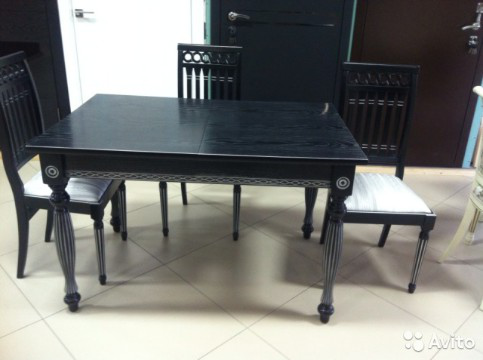

In [41]:
img

### Reading single image - Keras

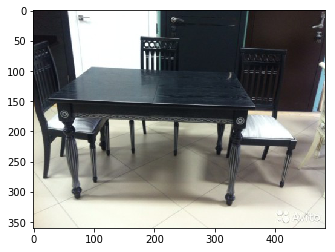

In [42]:
import matplotlib.pyplot as plt
%matplotlib inline

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
img = load_img('./datassd/images/train/' + str(imagenames['image'][0]))
plt.imshow(img)

In [43]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

In [44]:
str(img)

'<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=483x360 at 0x7F94EF303160>'

In [45]:
from keras.preprocessing import image
keras_array = image.img_to_array(img)

In [46]:
type(keras_array)

numpy.ndarray

In [47]:
keras_array.shape

(360, 483, 3)

In [54]:
np.array_equal(numpy_array, keras_array)

True

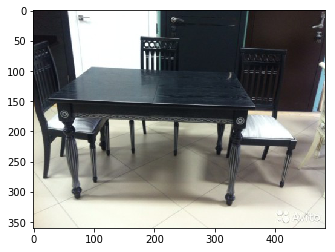

In [55]:
plt.imshow(numpy_array)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


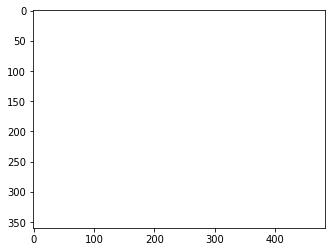

In [56]:
plt.imshow(keras_array)

Pyplot doesn't show the image in keras array. 

To show it, we turn it back to keras image

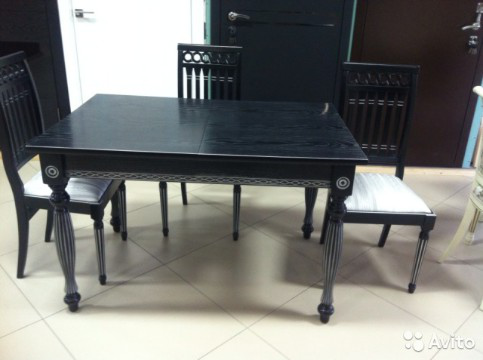

In [57]:
img = image.array_to_img(img)  
img

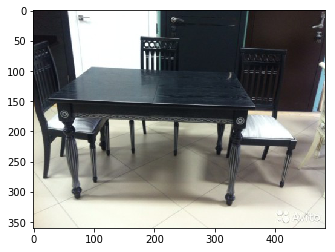

In [107]:
# or
plt.imshow(keras_array/255.)

## read n images from disk and turn them in keras form into 244,244,3 sized numpy array

### single thread version

In [66]:
max_images = 3000 # how many images to read
offset = 1000 # set 1000 etc to get later block

from keras.preprocessing import image

imagesdata = []

i = 0 # counter for found images
start = time.time()
for imagename in imagenames["image"][0+offset:max_images+offset]:
    try:
        img = image.load_img('./datassd/images/train/' + imagename, target_size=(224, 224))        
        img = image.img_to_array(img) # Converts a PIL Image instance to a Numpy array.
              
        i += 1
    except:
        img = np.zeros(shape = (224,224,3)) # if certain image is not present, replace with empty one
    
    imagesdata.append(img)
    
print(time.time() - start, i/1000)
type(img)


8.773586511611938 3.0


numpy.ndarray

For single thread, reading speed is a bit under 3 seconds per 1000 images

### Multithreaded version using Concurrent Futures

Move the code for reading a single image into a function. 
Start n parallel workers with "concurrent.futures". 
Create a list of image-filenames to iterate over.
With executor.map(function, iterables) call our image-reading function iterating over filenames.
Add each read image into a common list: "imagesdata". 

executor.map of concurrent.futures takes care that returned results (each a single numpy array of image) are returned in same order as filenames are fed from iterator. As a result, our resulting list will have data of images in same order as the filenames of images are.

Number of workers defaults to number of CPU threads available.
With 6-core/12-thread ryzen I want to limit workers to at maximum the number of physical cores.

Notice: If testing read speed, change offset for each run to read new images. Otherwise the already read images are returned from disk/os cache and not measure real reading speed.


In [7]:
max_images = 1000 # how many images to use
offset = 0000 # set 1000 etc to get later block

from keras.preprocessing import image
from PIL import Image as pil_image
imagesdata = []

def readImage(imagename):    
    try:   
        img = image.load_img('./datassd/images/train/' + imagename, target_size=(224, 224))             
        img = image.img_to_array(img) # Converts a PIL Image instance to a Numpy array.
        
    except:
        img = np.zeros(shape = (224,224,3)) # if image is not present, replace with empty one
        # keras..img_to_array(PIL image) returns a numpy array of (244,244,3)    
    return(img)

import concurrent.futures
start = time.time()

# create multiple core workers
with concurrent.futures.ProcessPoolExecutor(6) as executor: # on ryzen, default uses number of threads (2x cores)
    # get list to process
    #imagenames_parallel = imagenames["image"][0+offset:max_images+offset]
    imagenames_parallel = imagenames['image'][0+offset:max_images+offset]
    
    #for imagename     in zip(imagenames_parallel
    #                                               #executor.map(function, iterables)            
    for imagename, img in zip(imagenames_parallel, executor.map(readImage, imagenames_parallel, chunksize=5)):
        imagesdata.append(img)
    
print(time.time() - start)


/home/max/anaconda3/envs/mobilenet/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


1.3933346271514893


With multiple threads, reading speed is about 1 second per 1000 images - around 3 times as fast as single core.

### Turn list of read images into numpy.array

(1000, 224, 224, 3)
224
224
3
Size of imagesdata numpy array:1204224000


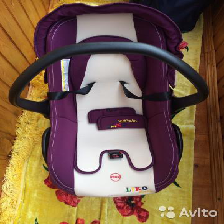

In [8]:
imagesdata = np.stack(imagesdata)
print(imagesdata.shape)

# check the shape of images
img = imagesdata[5]
print(len(img))
print(len(img[0]))
print(len(img[0][0]))

print('Size of imagesdata numpy array:' + str(imagesdata.nbytes))

# sanity check - print a picture
# get PIL image from keras array 
# display the PIL image
x = image.array_to_img(img)  
x

In [92]:
type(imagesdata)

numpy.ndarray

In [93]:
imagesdata.shape

(3000, 224, 224, 3)

Our images are in a numpy array, length of 3000 images, each line is a 224x224 pixel image with 3 color channels

# Extract features with vgg16    

We load a pre-trained Keras NN model.
To use it as a Feature Extractor, we leave last layer off (include_top=False) so latest layer is instead 512 features
(512 float values).
Pooling average translates otherwise 512x7x7 layer into 512.

When run for each image: features = model.predict( ...image), it will return those 512 features extracted from the image.

Later we can feed these 512 values as image-features to for example Light Gradient Boosting Machine,
to be used for model building in addition to features from textual and numerical data.




Keras model_x preprocess_input():

"The preprocess_input function is meant to adequate your image to the format the model requires.
Some models use images with values ranging from 0 to 1. Others from -1 to +1. Others use the "caffe" style, that is not normalized, but is centered.
From the source code, Resnet is using the caffe style.
You don't need to worry about the internal details of preprocess_input. But ideally, you should load images with the keras functions for that (so you guarantee that the images you load are compatible with preprocess_input)." 

x = np.expand_dims(x, axis=0)
Add dimension 1 to beginning. Only needed if feed batch of single image.

### Features extraction for single images in loop

In [72]:
# cut first n to speed up testing
imagesdata = imagesdata[0:2000,]

In [73]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

# load pretrained model but leave out the final layer (top=false), final layer will be our layer of 512 features
model = VGG16(weights='imagenet', include_top=False, pooling='avg') #pooling reduces size to 512 instead of 7x7x512
featuresdata = []

start = time.time()
for i in range(len(imagesdata)):
    img = imagesdata[i]
    x = image.img_to_array(img)  
    x = np.expand_dims(x, axis=0)  
    x = preprocess_input(x)    
    features = model.predict(x)
    
    featuresdata.append(features)
print(time.time() - start)

19.15800166130066


Speed for extracting features in single mode is about 100 images per second 

In [96]:
len(featuresdata)

1000

### Features extraction in batch
Feed into model.predict() function (n=images,224,224,3) numpy array. Define batch size small enough to fit into GPU memory.

In [9]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

# load pretrained model but leave out the final layer (top=false), so that is our layer of 512 features
model = VGG16(weights='imagenet', include_top=False, pooling='avg') #pooling reduces size to 512 instead of 7x7x512
featuresdata = []


input = np.stack(imagesdata) 
print(input.shape)

start = time.time()
input = preprocess_input(input) # process image by keras according to current loaded model
# feed our images to the model and get features

featuresdata = model.predict(input, batch_size=16)
print(time.time() - start)


print(len(featuresdata))

(1000, 224, 224, 3)
6.931763410568237
1000


Speed in batch mode is about 200 images per second. Almost half faster.


In [ ]:
# 18.6 s for 3000 images, batch:100
# 20.2 s for 3000 images, batch of 128
# 18.7 barch 96
# 17.47 batch 64
# 16.78 batch 32
# 16.35 for 16

But how much of this is due that 1st batch starts working earlier?
Test with larger amount 


### Write to csv

In [10]:
# turn to Pandas dataframe
data = pd.DataFrame(featuresdata)

In [12]:
data.shape

(1000, 512)

In [13]:
data

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,0.000000,0.000000,1.061084,0.000000,0.118974,0.020611,5.887372,1.086949,0.404557,0.157810,...,2.118891,3.189225,0.098592,20.586531,5.598942,2.079473,0.852627,0.023445,3.995780,0.000000
1,0.118921,2.593891,1.130870,3.152634,0.183077,1.746322,1.096425,1.166876,0.000000,0.000000,...,0.414874,10.185966,0.000000,0.000000,3.966652,15.125590,4.050233,0.000000,2.651531,0.000000
2,0.753170,0.963861,0.000000,0.000000,4.342747,2.319574,0.000000,0.503236,0.000000,0.137754,...,0.585942,3.478639,0.000000,0.000000,0.000000,2.712554,3.455214,1.332269,0.474930,0.065384
3,9.903719,0.000000,0.000000,0.000000,0.270759,1.809795,4.623905,0.000000,0.119059,1.075013,...,0.160459,3.854542,0.595932,0.187132,0.987977,0.000000,3.639786,2.123550,1.294548,0.046977
4,0.066430,0.000000,0.878307,8.749181,3.460947,8.317535,0.219658,0.343226,0.000000,0.046361,...,0.250896,6.171680,0.128447,0.000000,0.000000,0.511245,6.267338,0.000000,0.243654,0.000000
5,2.775887,3.276230,0.894810,0.000000,0.837925,4.878854,0.000000,1.666607,0.813655,7.222632,...,0.404502,11.081384,0.000000,2.963316,2.014328,2.983365,3.545245,0.837969,1.216567,3.334392
6,0.615780,7.875582,0.094263,1.905446,0.134784,3.505855,22.017595,0.017068,0.442577,0.153875,...,2.485790,0.705001,0.171239,2.044484,0.000000,5.297852,12.012497,0.259242,0.592051,0.000000
7,1.700511,0.000000,0.000000,0.191729,0.000000,0.868463,0.507022,0.454294,0.000000,1.583688,...,0.198730,4.933177,0.000000,6.046005,4.823501,0.229846,3.943618,0.247448,4.927316,3.071558
8,0.374173,0.108618,1.272698,0.221886,0.251760,0.575530,0.179150,2.212998,0.000000,0.718947,...,0.113322,9.129509,2.103611,16.579962,9.182988,0.778915,2.075906,0.498309,2.794971,0.081344
9,0.000000,3.426785,0.482114,6.409588,0.462319,3.741047,0.043649,0.316906,0.000000,29.748640,...,6.208570,0.885246,0.120373,1.262387,0.681413,0.280108,0.245865,7.075996,2.488408,0.215600


In [15]:
# add imagenames as 1st column
names = imagenames['image'][0:1000]

In [25]:
data2 = pd.DataFrame(data=np.column_stack((names,featuresdata)))

In [28]:
data2

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,512
0,d10c7e016e03247a3bf2d13348fe959fe6f436c1caf64c...,0,0,1.06108,0,0.118974,0.0206111,5.88737,1.08695,0.404557,...,2.11889,3.18923,0.0985923,20.5865,5.59894,2.07947,0.852627,0.0234452,3.99578,0
1,79c9392cc51a9c81c6eb91eceb8e552171db39d7142700...,0.118921,2.59389,1.13087,3.15263,0.183077,1.74632,1.09642,1.16688,0,...,0.414874,10.186,0,0,3.96665,15.1256,4.05023,0,2.65153,0
2,b7f250ee3f39e1fedd77c141f273703f4a9be59db4b48a...,0.75317,0.963861,0,0,4.34275,2.31957,0,0.503236,0,...,0.585942,3.47864,0,0,0,2.71255,3.45521,1.33227,0.47493,0.0653837
3,e6ef97e0725637ea84e3d203e82dadb43ed3cc0a1c8413...,9.90372,0,0,0,0.270759,1.8098,4.6239,0,0.119059,...,0.160459,3.85454,0.595932,0.187132,0.987977,0,3.63979,2.12355,1.29455,0.0469766
4,54a687a3a0fc1d68aed99bdaaf551c5c70b761b16fd0a2...,0.0664303,0,0.878307,8.74918,3.46095,8.31754,0.219658,0.343226,0,...,0.250896,6.17168,0.128447,0,0,0.511245,6.26734,0,0.243654,0
5,eb6ad1231c59d3dc7e4020e724ffe8e4d302023ddcbb99...,2.77589,3.27623,0.89481,0,0.837925,4.87885,0,1.66661,0.813655,...,0.404502,11.0814,0,2.96332,2.01433,2.98337,3.54524,0.837969,1.21657,3.33439
6,0330f6ac561f5db1fa8226dd5e7e127b5671d44d075a98...,0.61578,7.87558,0.0942634,1.90545,0.134784,3.50586,22.0176,0.017068,0.442577,...,2.48579,0.705001,0.171239,2.04448,0,5.29785,12.0125,0.259242,0.592051,0
7,9bab29a519e81c14f4582024adfebd4f11a4ac71d323a6...,1.70051,0,0,0.191729,0,0.868463,0.507022,0.454294,0,...,0.19873,4.93318,0,6.046,4.8235,0.229846,3.94362,0.247448,4.92732,3.07156
8,75ce06d1f939a31dfb2af8ac55f08fa998fa336d13ee05...,0.374173,0.108618,1.2727,0.221886,0.25176,0.57553,0.17915,2.213,0,...,0.113322,9.12951,2.10361,16.58,9.18299,0.778915,2.07591,0.498309,2.79497,0.0813443
9,54fb8521135fda77a860bfd2fac6bf46867ab7c06796e3...,0,3.42678,0.482114,6.40959,0.462319,3.74105,0.043649,0.316906,0,...,6.20857,0.885246,0.120373,1.26239,0.681413,0.280108,0.245865,7.076,2.48841,0.2156


In [37]:

# write 1000 lines of features to scv, with imagename
f = open('features1k.csv', 'a')
data2.to_csv(f, sep='\t', header=None, mode='a')
f.close()

#df.to_csv('test.csv', sep='\t', header=None, mode='a')

### Measure used RAM

In [99]:
import sys
sys.getsizeof(imagesdata)

144

In [105]:
imagesdata.nbytes

602112000

1000 images takes 0.602 GB of memory

To get more accurate, we can start tracemalloc, run code, then print largest objects in memory

In [101]:
# find largest objects in memory
import tracemalloc
import os
import linecache

def display_top(snapshot, key_type='lineno', limit=3):
    snapshot = snapshot.filter_traces((
        tracemalloc.Filter(False, "<frozen importlib._bootstrap>"),
        tracemalloc.Filter(False, "<unknown>"),
    ))
    top_stats = snapshot.statistics(key_type)

    print("Top %s lines" % limit)
    for index, stat in enumerate(top_stats[:limit], 1):
        frame = stat.traceback[0]
        # replace "/path/to/module/file.py" with "module/file.py"
        filename = os.sep.join(frame.filename.split(os.sep)[-2:])
        print("#%s: %s:%s: %.1f KiB"
              % (index, filename, frame.lineno, stat.size / 1024))
        line = linecache.getline(frame.filename, frame.lineno).strip()
        if line:
            print('    %s' % line)

    other = top_stats[limit:]
    if other:
        size = sum(stat.size for stat in other)
        print("%s other: %.1f KiB" % (len(other), size / 1024))
    total = sum(stat.size for stat in top_stats)
    print("Total allocated size: %.1f KiB" % (total / 1024))


In [104]:
tracemalloc.start()
# run code here
snapshot = tracemalloc.take_snapshot()
display_top(snapshot)

Top 3 lines
#1: python3.6/linecache.py:137: 13.4 KiB
    lines = fp.readlines()
#2: python3.6/re.py:255: 1.5 KiB
    s = list(pattern)
#3: json/decoder.py:355: 1.5 KiB
    obj, end = self.scan_once(s, idx)
101 other: 28.9 KiB
Total allocated size: 45.2 KiB


### If needed, release RAM

In [ ]:
# delete object and call gc.collect()
import gc
#del imagesdata
gc.collect()

Run above processes for whole 1,3 million images:
    - read in blocks of few thousand images
    - get and store predictions
    
    - write into file
    
    Turn both modules into a function
    def readBatch()
    
    and
    def predictBatch()
    
    Then use Keras generator
    
    

Turn image into Keras-array. expand_dims add sample_size

In [ ]:
# https://stackoverflow.com/questions/41378461/how-to-use-models-from-keras-applications-for-transfer-learnig
input vg16 with shape parameter

In [ ]:
import sys
sys.getsizeof(imagesdata)

In [ ]:
# generator test

In [ ]:
len(imagenames)

### Yield images in batches

In [7]:
def getBatches(max_images=1000, batch_size=100):  # yield #batch_size images
    current = 0
    imagesdata=[]
    
    while True and current<max_images-batch_size:
        imagesdata=[]
        for i in range(batch_size):
            img = readImage(imagenames['image'][current+1])
            imagesdata.append(img)
        current += batch_size
        yield imagesdata

    # process the rest few remaining, less than batch size  
    #while current<max_images:
    imagesdata=[]
    for i in range(max_images-current):
            img = readImage(imagenames['image'][current+1])
            imagesdata.append(img)
        #current += batch_size
    yield imagesdata
    

### get images in batches, get featuresdata from model.predict

In [88]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

model = VGG16(weights='imagenet', include_top=False, pooling='avg') #pooling reduces size to 512 instead of 7x7x512


featuresdata = []
batch =[]

batch_size=100
#max_images = len(imagenames)
max_images=1000

#iterator
generator = getBatches(max_images, batch_size)


start = time.time()

for i in generator:
    
    batch = preprocess_input( np.stack(i))
    result = model.predict(batch,batch_size=batch_size)
    for r in result:
        featuresdata.append(r)

print(time.time() - start)        

# 1000: 6 s
# 10k: 72 s
# 10k, 120 batch: 74 s

7.518132448196411


In [49]:
featuresdata[0][0] # 2 preprocess_input

0.19015393

In [66]:
featuresdata[0][0] # 1 preprocess_input

0.11892307

In [91]:
featuresdata[1][0]

0.19015393

In [85]:
featuresdata[1][0] # read 1000 from start

0.118920505

### Write chunk of n features to HDF5

In [ ]:
http://machinelearninguru.com/deep_learning/data_preparation/hdf5/hdf5.html

In [ ]:
http://christopherlovell.co.uk/blog/2016/04/27/h5py-intro.html

In [39]:
hdf5_file.close()    

In [2]:
class Writer:
    
    def __init__(self, filename):
        self.filename = filename
        
    def append(self, batch):
        self.hdf5_file["imagefeatures"][hd5counter, ...] = batch
        
    def close(self):
        self.hdf5_file.close()  
                


In [3]:
class WriterHDF5:
    
    def __init__(self, filename, max_images):
        self.filename = filename
        self.max_images = max_images

        self.data_shape = (max_images, 512)
        
        self.hdf5_file = h5py.File(self.filename, mode='w')
        self.hdf5_file.create_dataset("imagefeatures", data_shape, np.float32)
        self.hd5counter =0
        
    def append(self, batch):   
        self.hdf5_file["imagefeatures"][hd5counter, ...] = batch
        self.hdf5counter += len(batch)

    def close(self):
        self.hdf5_file.close()  
        
        

In [ ]:
     

start = time.time()

max_images = 2000
mywriter = WriterHDF5('featurestest.h5', max_images)

for i in generator:
    
    batch = preprocess_input( np.stack(i))
    batch = preprocess_input(batch)
    result = model.predict(batch,batch_size=batch_size)
    for r in result:
         mywriter.append(r)
        

In [ ]:
mywriter = Writer



In [47]:
# write to disk settings
hdf5_path = 'imagefeatures_1k_f32.h5'
data_shape = (len(featuresdata), 512) # tensorflow

# open a hdf5 file and create earrays
hdf5_file = h5py.File(hdf5_path, mode='w')
#hdf5_file.create_dataset("imagefeatures", data=featuresdata)
hdf5_file.create_dataset("imagefeatures", data_shape, np.float32)

start = time.time()
hd5counter =0
for features in featuresdata:    
        hdf5_file["imagefeatures"][hd5counter, ...] = features
        hd5counter += 1

hdf5_file.close()    
print(time.time() - start)        

# 1k lines written in 0.2 s, filesize 2 MB

0.2233264446258545


### Read back from HDF5

In [59]:
# read the hdf5 file
hdf = h5py.File('imagefeatures_1k.h5', 'r')
print(hdf.keys())
our_features = hdf.get('imagefeatures')
print(our_features)

array = np.array(our_features)
hdf.close()
# http://machinelearninguru.com/deep_learning/data_preparation/hdf5/hdf5.html

KeysView(<HDF5 file "imagefeatures_1k.h5" (mode r)>)
<HDF5 dataset "imagefeatures": shape (1000, 512), type "<f4">


In [63]:
# read the hdf5 file
hdf = h5py.File('imagefeatures_1k_f32.h5', 'r')
print(hdf.keys())
our_features = hdf.get('imagefeatures')
print(our_features)
array2 = np.array(our_features)
hdf.close()

KeysView(<HDF5 file "imagefeatures_1k_f32.h5" (mode r)>)
<HDF5 dataset "imagefeatures": shape (1000, 512), type "<f4">


In [54]:
hdf.close()

In [55]:
print(our_features)

<Closed HDF5 dataset>


In [61]:
array.shape

(1000, 512)

In [62]:
array[0][0]

0.19015393

In [64]:
array2[0][0]

0.19015393

### generator + writing features to HDF5 file

In [11]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import h5py

model = VGG16(weights='imagenet', include_top=False, pooling='avg') #pooling reduces size to 512 instead of 7x7x512

featuresdata = []
batch =[]


batch_size=100 # 100

#max_images = len(imagenames)
max_images=10000

#iterator
generator = getBatches(max_images, batch_size)


# write to disk settings  
hdf5_path = 'imagefeatures.h5'
data_shape = (max_images, 512)
hdf5_file = h5py.File(hdf5_path, mode='w')
#hdf5_file.create_dataset("imagefeatures", data=featuresdata)
hdf5_file.create_dataset("imagefeatures", data_shape, np.float32)

start = time.time()
hd5counter =0
for i in generator:
    
    batch = preprocess_input( np.stack(i))
    batch = preprocess_input(batch)
    result = model.predict(batch,batch_size=batch_size)
    for r in result:
        #featuresdata.append(r)
        # write to disk
        hdf5_file["imagefeatures"][hd5counter, ...] = r
        hd5counter += 1

hdf5_file.close()    
    
print(time.time() - start)        

# 1000: 6 s
# 10k: 72 s
# 10k, 120 batch: 74 s
# 10k with hdf5 writing: 77.4 s 
# 2nd trun: 120 s using gzip. 363 k vs 18 MB

76.54156184196472


In [ ]:
# 13:21 started

In [12]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import h5py

model = VGG16(weights='imagenet', include_top=False, pooling='avg') #pooling reduces size to 512 instead of 7x7x512

featuresdata = []
batch =[]




In [ ]:
batch_size=100 # 100

#max_images = len(imagenames)
max_images=10000

#iterator
generator = getBatches(max_images, batch_size)

# write to disk settings
hdf5_path = 'imagefeatures.h5'
data_shape = (max_images, 512) # tensorflow

# open a hdf5 file and create earrays
hdf5_file = h5py.File(hdf5_path, mode='w')
#hdf5_file.create_dataset("imagefeatures", data=featuresdata)
hdf5_file.create_dataset("imagefeatures", data_shape, np.float32)

start = time.time()
hd5counter =0
for i in generator:
    
    batch = preprocess_input( np.stack(i))
    batch = preprocess_input(batch)
    result = model.predict(batch,batch_size=batch_size)
    for r in result:
        #featuresdata.append(r)
        # write to disk
        hdf5_file["imagefeatures"][hd5counter, ...] = r
        hd5counter += 1

hdf5_file.close()    
    
print(time.time() - start)        

# 1000: 6 s
# 10k: 72 s
# 10k, 120 batch: 74 s
# 10k with hdf5 writing: 77.4 s 
# 2nd trun: 120 s using gzip. 363 k vs 18 MB

<class 'numpy.ndarray'>
(100, 224, 224, 3)


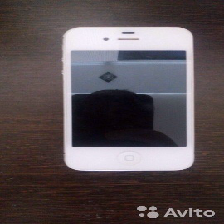

In [187]:
print(type(batch))
print(batch.shape)

img = batch[0]
img = image.array_to_img(img)
img

In [197]:
featuresdata = np.stack(featuresdata)
featuresdata.shape

(1000, 512)

In [ ]:
batch


In [186]:
featuresdata

[array([4.94465923e+00, 3.64274812e+00, 1.95950794e+01, 0.00000000e+00,
        1.66063952e+00, 0.00000000e+00, 3.08724225e-01, 2.04276562e+00,
        1.02122271e+00, 2.66921520e+00, 0.00000000e+00, 0.00000000e+00,
        5.79681015e+00, 8.01355362e+00, 0.00000000e+00, 1.03006577e+00,
        4.60095596e+00, 5.82835293e+00, 0.00000000e+00, 3.64504504e+00,
        3.67093992e+00, 5.97122860e+00, 5.62420964e-01, 1.58426399e+01,
        2.33429766e+00, 0.00000000e+00, 1.98508158e-01, 1.31687510e+00,
        1.70350230e+00, 0.00000000e+00, 3.62235999e+00, 8.33020496e+00,
        3.15911698e+00, 3.39795679e-01, 0.00000000e+00, 4.29655790e-01,
        0.00000000e+00, 4.92099464e-01, 2.74396267e+01, 5.76678105e-02,
        8.60807821e-02, 0.00000000e+00, 1.07284737e+01, 0.00000000e+00,
        5.69264269e+00, 1.33525896e+00, 4.10261583e+00, 1.22255259e+01,
        0.00000000e+00, 1.51751499e+01, 5.53573465e+00, 9.64448094e-01,
        3.88157666e-01, 6.10064328e-01, 0.00000000e+00, 2.919256

In [ ]:
    def append(self, values):
        with h5py.File(self.datapath, mode='a') as h5f:
            dset = h5f[self.dataset]
            dset.resize((self.i + 1, ) + shape)
            dset[self.i] = [values]
            self.i += 1
            h5f.flush()

In [178]:
# read the hdf5 file
hf = h5py.File('imagefeatures.h5', 'r')
print(hf.keys())
our_features = hf.get('imagefeatures')
# http://machinelearninguru.com/deep_learning/data_preparation/hdf5/hdf5.html

KeysView(<HDF5 file "imagefeatures.h5" (mode r)>)


In [179]:

print(our_features)
print(type(our_features))

<HDF5 dataset "imagefeatures": shape (10000, 512), type "<f4">
<class 'h5py._hl.dataset.Dataset'>


In [180]:
# x = np.array(our_features)
# x = np.array(our_features[0])
x = np.array(our_features[0:500])

In [181]:
hf.close()

In [182]:
type(x)

numpy.ndarray

In [183]:
x.shape

(500, 512)

In [132]:
hdf5_file.close()

### mode 2 - retrain model with our pictures

In [ ]:
# https://stackoverflow.com/questions/41378461/how-to-use-models-from-keras-applications-for-transfer-learnig

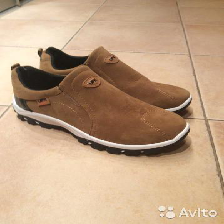

In [108]:
# test an image
img_path = './images/train/856e74b8c46edcf0c0e23444eab019bfda63687bb70a3481955cc6ab86e39df2.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img

In [ ]:
features = model.predict(x)

In [ ]:
import cv2
cv2.imshow('image',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Old - other ways to read image

In [ ]:
#PIL.JpegImagePlugin.JpegImageFile
images224x=[]
for img in imagesdata:
    img.thumbnail(224,224)

In [ ]:
import scipy
new_shape = (224,224,3)
X_train_new = np.empty(shape=(X_train.shape[0],)+new_shape)
for idx in xrange(X_train.shape[0]):
    X_train_new[idx] = scipy.misc.imresize(X_train[idx], new_shape)

In [ ]:
# example
images = []
for f in files:
    img = image.load_img(f)
    #img = img.resize((48, 48))
    img = image.img_to_array(img)
    img = preprocess(img)

    images.append(img)
inputs2 = np.asarray(images)

print(np.mean(inputs))

In [ ]:
for i in generator:
    print(i)

In [ ]:
#example 
import multiprocessing.Pool

p = multiprocessing.Pool() # use all available CPUs

input = open("input.txt")
x = (process_line(line) for line in input)
y = p.imap(process_item, x)
z = (generate_output_line(item) + "\n" for item in y)
output = open("output.txt", "w")
output.writelines(z)

In [ ]:
# https://wiki.python.org/moin/Generators
# a generator that yields items instead of returning a list
def firstn(n):
     num = 0
     while num < n:
         yield num
         num += 1

In [ ]:
 
sum_of_first_n = sum(firstn(5))
sum_of_first_n

In [ ]:
gen = firstn(5)

In [ ]:
for i in gen:
    print(i)